# Test the `pytesseract` package

---

To install tesseract on Ubuntu I used : https://www.datacorner.fr/tesseract/

## Import package

In [13]:
try:
    from PIL import Image
except ImportError:
    import Image
    
import pytesseract
import cv2
import numpy as np

from os import listdir
from os.path import isfile, join, isdir
import os.path
import time

import matplotlib.pyplot as plt

In [2]:
%env TESSDATA_PREFIX /usr/share/tesseract-ocr/4.00/tessdata/

env: TESSDATA_PREFIX=/usr/share/tesseract-ocr/4.00/tessdata/


## List examples files

In [3]:
# Get all directories with examples
example_path = '../Exemples/'
subdir_paths = [
    join(example_path, p) 
    for p in listdir(example_path) 
    if isdir(join(example_path, p))
]

# Retrieves all files in example dir
files = []
for p in [example_path] + subdir_paths:
    _files = [join(p, f) for f in listdir(p) if isfile(join(p, f))]
    
    files = files + _files
    

# Keeps only jpg extension files
files = [f for f in files if f[-3:] in ['jpg']]


files

['../Exemples/Ex_Maths/IMG_20210329_123828.jpg',
 '../Exemples/Ex_Maths/IMG_20210329_122221.jpg',
 '../Exemples/Ex_Maths/IMG_20210329_123818.jpg',
 '../Exemples/Ex_Maths/IMG_20210329_122227.jpg',
 '../Exemples/Ex_Maths/IMG_20210329_122202.jpg',
 '../Exemples/Ex_Maths/IMG_20210329_122715.jpg',
 '../Exemples/Ex_Maths/IMG_20210329_122724.jpg',
 '../Exemples/Ex_Maths/IMG_20210329_123813.jpg',
 '../Exemples/Ex_Maths/IMG_20210329_122157.jpg',
 '../Exemples/Ex_Maths/IMG_20210329_122738.jpg',
 '../Exemples/Histoire_Geo/IMG_20210329_122543.jpg',
 '../Exemples/Histoire_Geo/IMG_20210329_123005.jpg',
 '../Exemples/Histoire_Geo/IMG_20210329_122940.jpg',
 '../Exemples/Histoire_Geo/IMG_20210329_123000.jpg',
 '../Exemples/Histoire_Geo/IMG_20210329_122932.jpg',
 '../Exemples/Histoire_Geo/IMG_20210329_122524.jpg',
 '../Exemples/Histoire_Geo/IMG_20210329_122536.jpg',
 '../Exemples/Dictee/IMG_20210329_122324.jpg',
 '../Exemples/Dictee/IMG_20210329_122825.jpg',
 '../Exemples/Dictee/IMG_20210329_122839.jpg'

In [4]:
subdir_paths

['../Exemples/Ex_Maths',
 '../Exemples/Histoire_Geo',
 '../Exemples/Dictee',
 '../Exemples/SVT',
 '../Exemples/Ex_COD',
 '../Exemples/Present_indicatif']

## Try pytesseract usage

More details on the Pypi page : https://pypi.org/project/pytesseract/

In [21]:
from PIL import Image, ExifTags

def load_image(fpath):
    image = Image.open(fpath)

    for orientation in ExifTags.TAGS.keys():
        if ExifTags.TAGS[orientation]=='Orientation':
            break
    
    exif = image._getexif()

    image = image.rotate(orientation)

    return image

def plot_image(img, figsize=(10,10)):
    fig = plt.figure(figsize=figsize)
    plt.imshow(img, cmap='gray')
    
    plt.show()

def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])

def reduce_size(img, min_size=None, ratio=None):
    w, h = img.size
    
    if min_size:
        if w < h:
            new_w = min_size
            new_h = w * min_size / h
        else:
            new_h = min_size
            new_w = h * min_size / w
            
    else:
        new_w = w * ratio
        new_h = h * ratio
            
    img = img.resize((int(new_w), int(new_h)), Image.ANTIALIAS)
            
    return img

def extract_text_from_image(img):    
    # img = reduce_size(img, ratio=2/3)
    
    res = pytesseract.image_to_string(img, lang='fra')
    
    return res

In [103]:
subdir = subdir_paths[3]

print('Directory:', subdir)
results = {}

for fpath in [f for f in files if subdir in f]:
    print(fpath)
    res = {}
    t0 = time.time()
    
    img = load_image(fpath)
    
    text = extract_text_from_image(img)
    
    t_end = time.time() - t0
    print('end in %.1fs'%t_end)
    
    res['time'] = t_end
    res['text'] = text
    res['img'] = img
    
    results[fpath] = res
    

Directory: ../Exemples/SVT
../Exemples/SVT/IMG_20210329_123138.jpg
end in 4.7s
../Exemples/SVT/IMG_20210329_122617.jpg
end in 4.6s
../Exemples/SVT/IMG_20210329_122614.jpg
end in 4.7s
../Exemples/SVT/IMG_20210329_123021.jpg
end in 4.4s
../Exemples/SVT/IMG_20210329_122633.jpg
end in 5.2s
../Exemples/SVT/IMG_20210329_122621.jpg
end in 4.8s
../Exemples/SVT/IMG_20210329_122629.jpg
end in 4.8s
../Exemples/SVT/IMG_20210329_123025.jpg
end in 4.7s
../Exemples/SVT/IMG_20210329_123017.jpg
end in 4.7s
../Exemples/SVT/IMG_20210329_123029.jpg
end in 5.2s
../Exemples/SVT/IMG_20210329_123132.jpg
end in 4.0s


In [104]:
for k, res in results.items():
    print(k)
    print()
    print(res['text'])
    print()
    print('==============================')

../Exemples/SVT/IMG_20210329_123138.jpg

| De quoi est composée la plante ?

est ‘ omposee
l'une partie souterraine qui = étend (partois très toIn de l'endroit OÙ se trouve la phm1«- en surface)
d’une partie €N surface (tgé feuilles, graines fruits fleu

2 De quoi a besoin la plante”

1lante de récuperer de l'énergie pour se développer.

e soleil permet à la [
olter de l’'énergie pou! survivre

Sans soleil, elle Ne peut pas rec

tiel pour ia survie e la plante

essentiels à la plante pour

L’eau apporte des nutriments (qui sont

rester en bon état

peut prendre beaucoup de

e souterraine de la plante
ler où elles veulent, \a

acines ne peuvent pas al
ante peut être empêchée.

La parti
place. Si les r
croissance de la pl

 


../Exemples/SVT/IMG_20210329_122617.jpg

1. De quoi est composée la plante?

La plante est composée:
d’une partie souterraine qui s'étend (parfois très loin de l’endroit où se trouve la plante en surface),
d’une partie en surface (tige, feuilles graines,fruits, fl

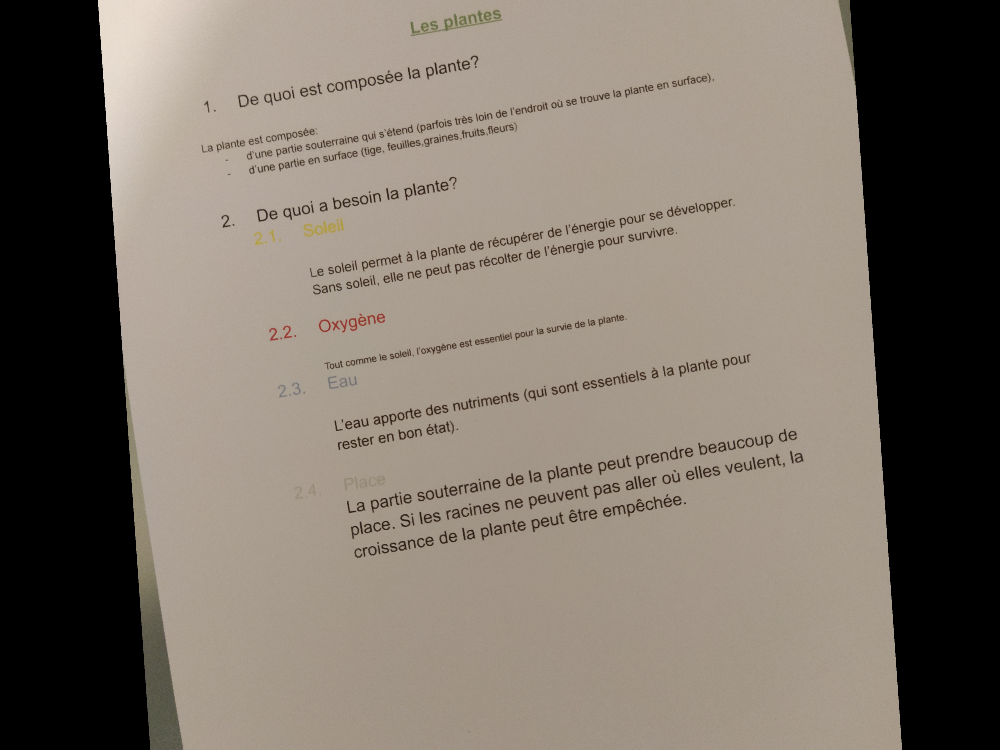

In [106]:
results['../Exemples/SVT/IMG_20210329_123029.jpg']['img']

Before doing some preprocessing we need to identify the text angle so we can rotate the image.

We can look at this page to do so : https://www.pyimagesearch.com/2017/02/20/text-skew-correction-opencv-python/

## Find text orientation

If we want to get better results, we need to put the image with a correct text orientation on the `tesseract` model. 

In [91]:
fpath = '../Exemples/SVT/IMG_20210329_123029.jpg'

In [213]:
def fix_orientation(orientation):
    if orientation < 45:
        return 0
    elif orientation < 135:
        return 90
    elif orientation < 225:
        return 180
    elif orientation < 315:
        return 270
    return 0

def crop_black_border(img):
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray,1,255,cv2.THRESH_BINARY)
    
    contours,hierarchy = cv2.findContours(
        thresh,cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )
    
    cnt = contours[0]
    
    x,y,w,h = cv2.boundingRect(cnt)
    crop = img[y:y+h,x:x+w]
    
    return crop

def load_image(fpath):
    image = Image.open(fpath)

    for orientation in ExifTags.TAGS.keys():
        if ExifTags.TAGS[orientation]=='Orientation':
            break
            
    orientation = fix_orientation(orientation)
            
    exif = image._getexif()
    image = image.rotate(orientation)
    
    image = np.array(image)
    
    image = crop_black_border(image)

    return image


def image_to_gray(image, threshold=False):
    # convert the image to grayscale and flip the foreground
    # and background to ensure foreground is now "white" and
    # the background is "black"
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.bitwise_not(gray)

    # threshold the image, setting all foreground pixels to
    # 255 and all background pixels to 0
    if threshold:
        gray = cv2.threshold(
            gray, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
    
    return gray

def find_text_angle(image):
    """
    inspired by http://felix.abecassis.me/2011/09/opencv-detect-skew-angle/
    """

    lines = cv2.HoughLinesP(image, rho=1, 
                              theta=1*np.pi/180, threshold=100,
                              minLineLength=100, maxLineGap=50)
    
    angles = list()

    for line in lines:
        line = line[0]
        angle = np.arctan2((line[3] - line[1]), (line[2] - line[0]))
        angles.append(angle)

    # mean angle 
    angle = np.mean(angles) * 180 / np.pi
    
    return angle


def rotate_img(image, angle):
    image_center = tuple(np.array(image.shape[1::-1]) / 2)
    
    rot_mat = cv2.getRotationMatrix2D(
        image_center, angle, 1.0)
    
    result = cv2.warpAffine(
        image, rot_mat, image.shape[1::-1], flags=cv2.INTER_LINEAR)
    
    return result

In [243]:
def preprocess_image(image):    
    image_gray = image_to_gray(image, threshold=False)

    angle = find_text_angle(image_gray)

    image_fixed = rotate_img(image_gray, angle)
    
    return image_fixed

In [235]:
def plot_2_images(img1, img2):
    fig, axes = plt.subplots(1, 2, figsize=(18,9))
    
    ax = axes[0]
    ax.imshow(img1)
    ax.set_title('Original')
    
    ax = axes[1]
    ax.imshow(img2, cmap='gray')
    ax.set_title('Preprocessed')
    
    plt.show()

In [240]:
fpath = '../Exemples/SVT/IMG_20210329_123138.jpg'


In [244]:
image = load_image(fpath)
image_preprocessed = preprocess_image(image) 

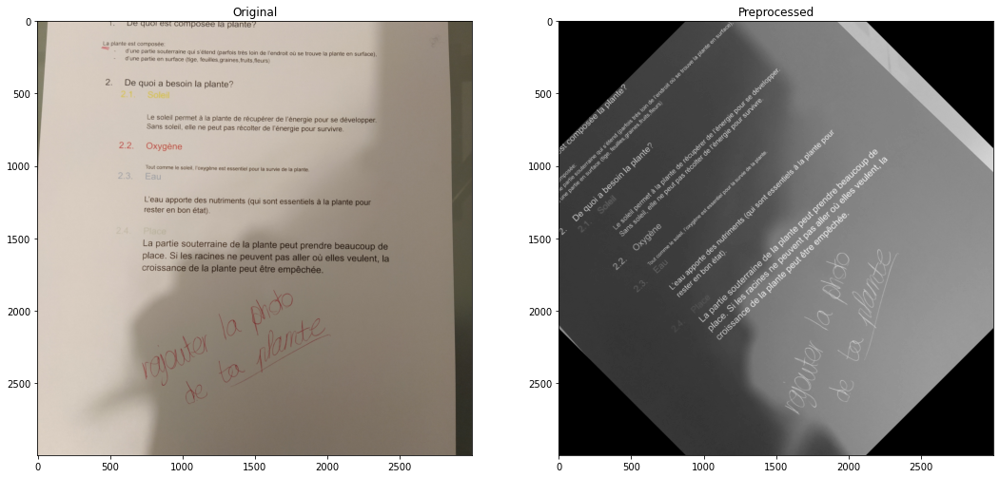

In [245]:
plot_2_images(image, image_preprocessed)

Directory: ../Exemples/SVT
../Exemples/SVT/IMG_20210329_123138.jpg
time preprocessed: 2.784s
time extract text from original: 4.707s
time extract text from preprocessed: 0.831s


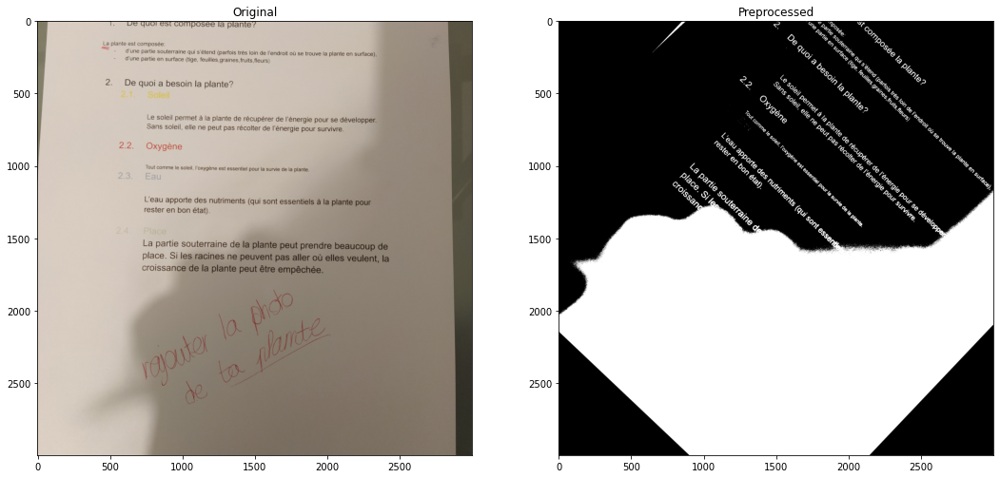


../Exemples/SVT/IMG_20210329_122617.jpg
time preprocessed: 1.345s
time extract text from original: 4.852s
time extract text from preprocessed: 0.879s


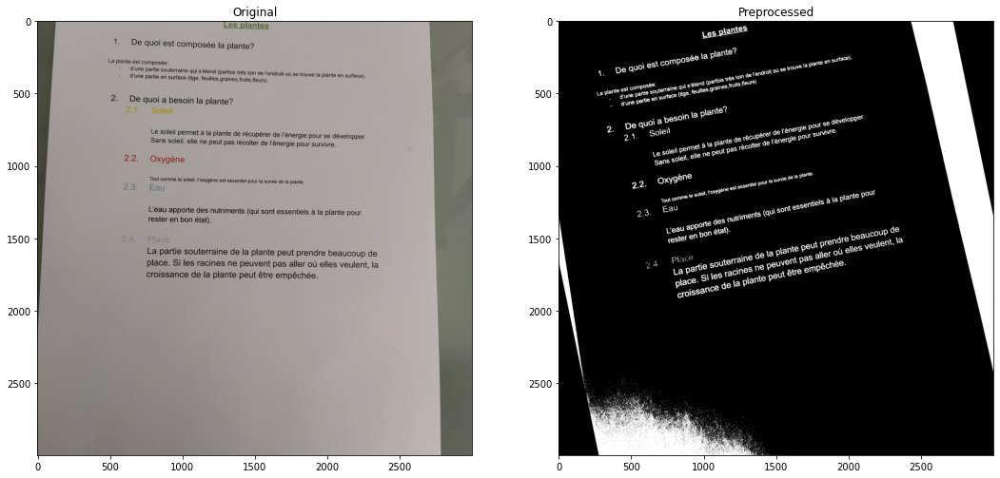


../Exemples/SVT/IMG_20210329_122614.jpg
time preprocessed: 1.284s
time extract text from original: 4.653s
time extract text from preprocessed: 0.866s


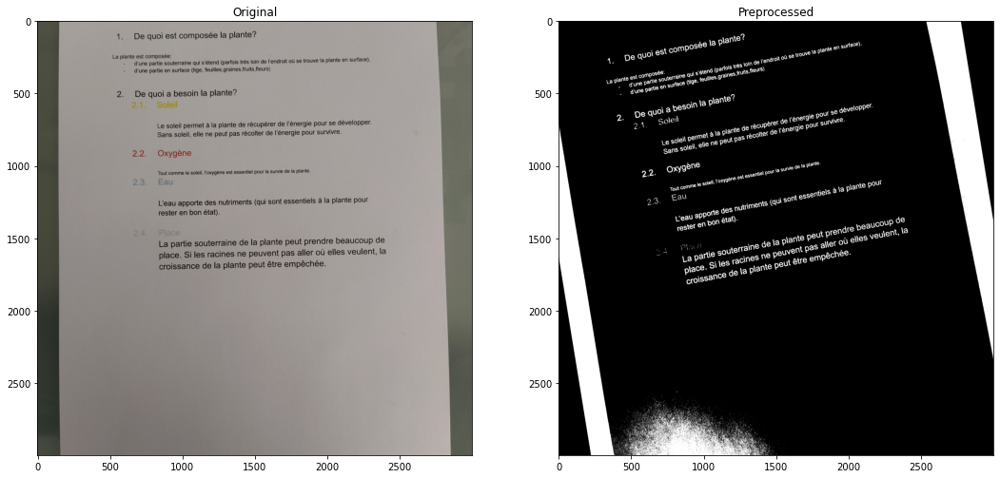


../Exemples/SVT/IMG_20210329_123021.jpg
time preprocessed: 4.059s
time extract text from original: 4.004s
time extract text from preprocessed: 0.711s


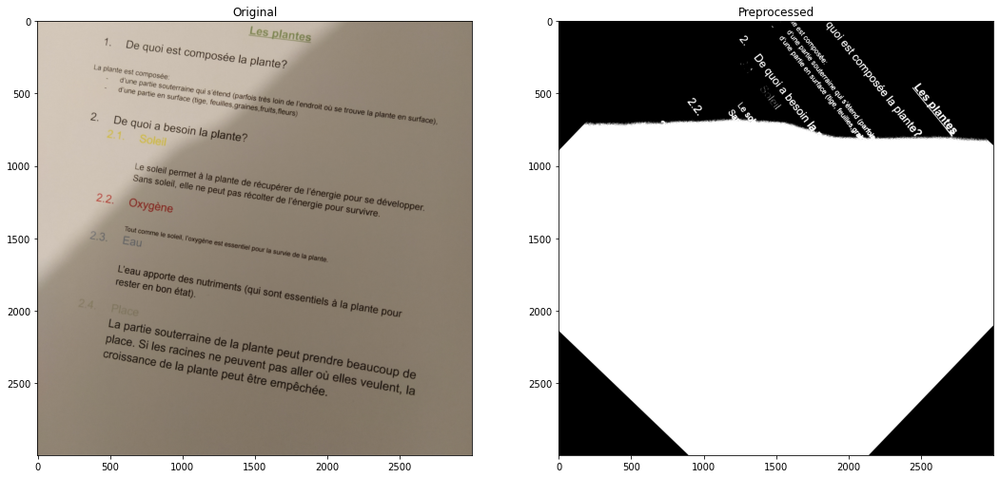


../Exemples/SVT/IMG_20210329_122633.jpg
time preprocessed: 1.042s
time extract text from original: 5.349s
time extract text from preprocessed: 0.842s


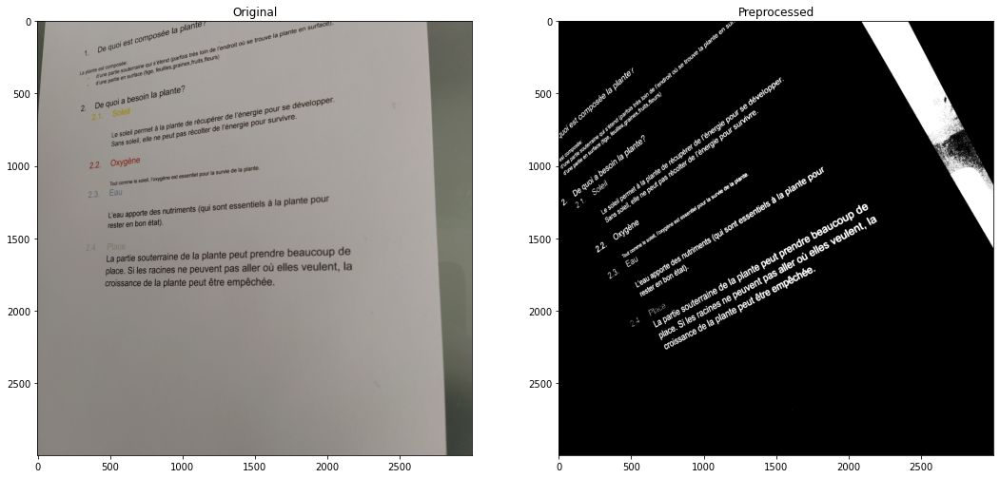


../Exemples/SVT/IMG_20210329_122621.jpg
time preprocessed: 0.578s
time extract text from original: 4.879s
time extract text from preprocessed: 1.081s


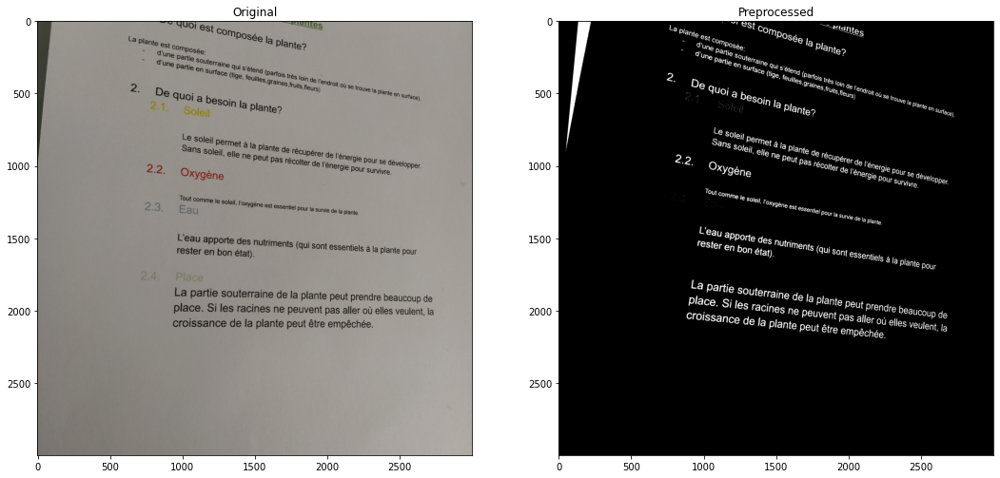


../Exemples/SVT/IMG_20210329_122629.jpg
time preprocessed: 1.086s
time extract text from original: 5.059s
time extract text from preprocessed: 0.805s


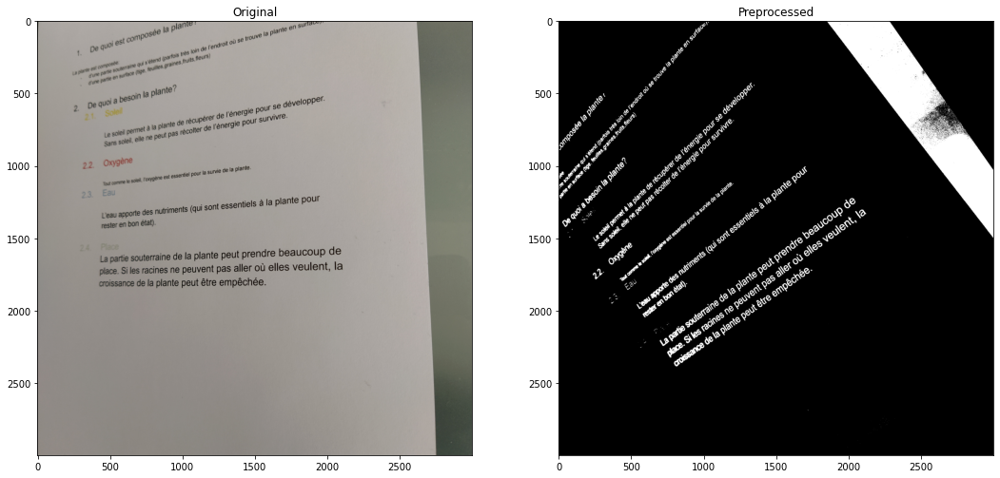


../Exemples/SVT/IMG_20210329_123025.jpg
time preprocessed: 0.645s
time extract text from original: 4.830s
time extract text from preprocessed: 1.639s


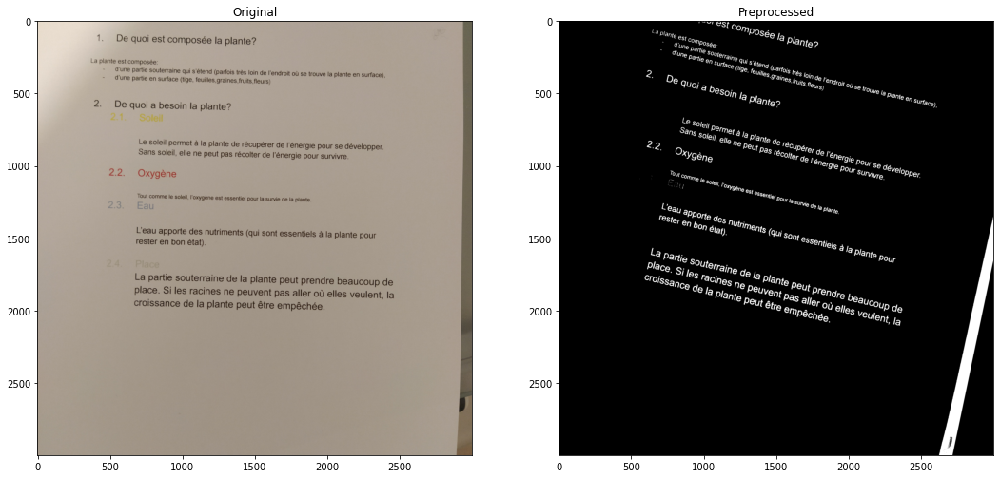


../Exemples/SVT/IMG_20210329_123017.jpg
time preprocessed: 3.942s
time extract text from original: 4.044s
time extract text from preprocessed: 0.730s


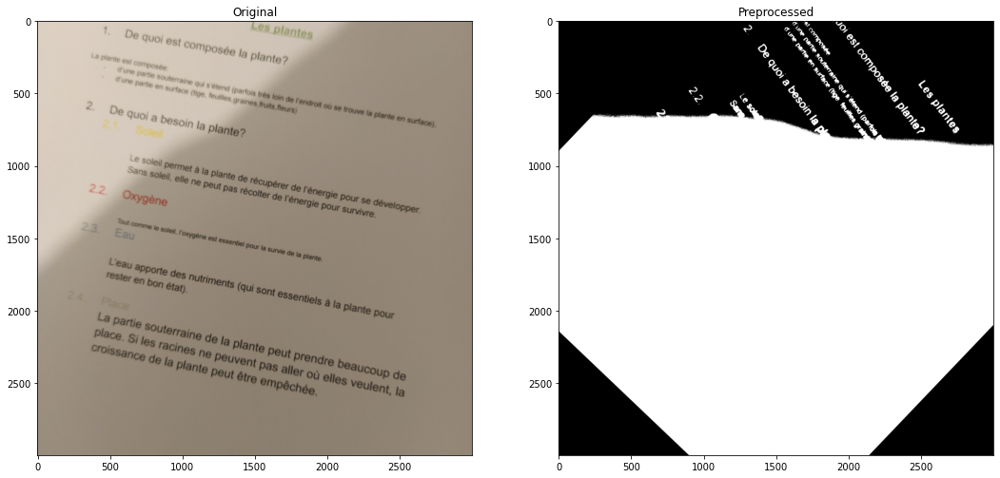


../Exemples/SVT/IMG_20210329_123029.jpg
time preprocessed: 0.587s
time extract text from original: 5.194s
time extract text from preprocessed: 1.570s


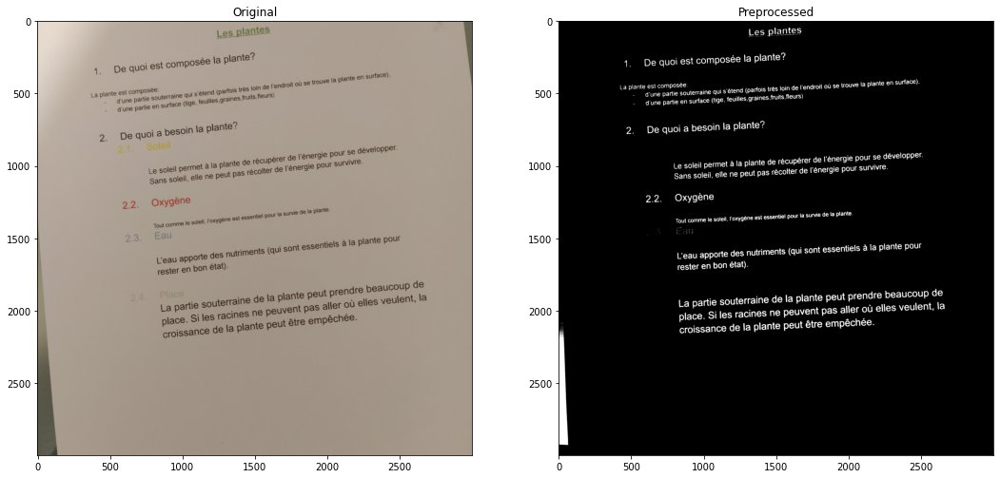


../Exemples/SVT/IMG_20210329_123132.jpg
time preprocessed: 2.944s
time extract text from original: 4.398s
time extract text from preprocessed: 0.769s


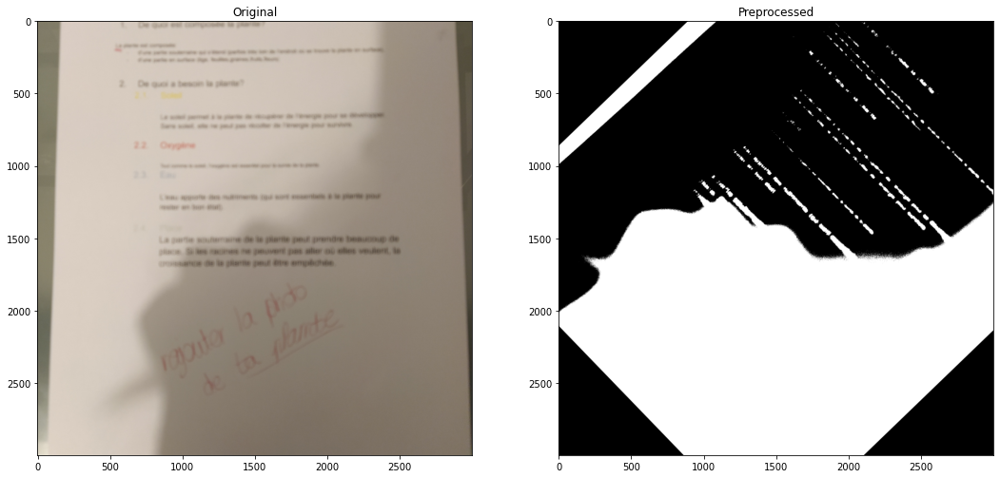

In [239]:
subdir = subdir_paths[3]

print('Directory:', subdir)
results = {}

for fpath in [f for f in files if subdir in f]:
    print(fpath)
    res = {}
    
    # Compute load time
    t0 = time.time()
    image = load_image(fpath)
    t_load = time.time() - t0
    
    # Compute preprocess time
    image_preprocessed = preprocess_image(image) 
    t_preprocess = time.time() - t0
    print('time preprocessed: %.3fs'%t_preprocess)
    
    # Extract text time on original image
    t0 = time.time()
    text_orig = extract_text_from_image(image)
    t_res_origin = time.time() - t0
    print('time extract text from original: %.3fs'%t_res_origin)
    
    # Extract text time on preprocessed image
    t0 = time.time()
    text = extract_text_from_image(image_preprocessed)
    t_res_preproc = time.time() - t0
    print('time extract text from preprocessed: %.3fs'%t_res_preproc)
    
    plot_2_images(image, image_preprocessed)
    
    res['time_load'] = t_load
    res['time_preprocess'] = t_preprocess
    res['time_res_original'] = t_res_origin
    res['time_res_preprocess'] = t_res_preproc
    
    res['text_orig'] = text_orig
    res['text_preprocess'] = text
    
    results[fpath] = res
    print()